In [2]:
from __future__ import division
import pyomo.environ as pyo
import numpy as np
import matplotlib.pyplot as plt

available_solvers = pyo.SolverFactory._cls
# print(list(available_solvers.keys()))

In [182]:
# GLOBAL VARIABLES
r_cm = 3   # cm 
L_cm = 5  # cm
Ts = 0.1   # s
MAX_U = 10 # rad/s
MAX_deltaU = 10

def solve_cftoc_batch(q0, qf, N, P, r, L, Ts, MAX_deltaU):
    model = pyo.ConcreteModel()

    #Define the variables
    nq = 5
    nu = 2
    model.N = N
    model.tidx = pyo.Set(initialize=range(N+1), ordered=True)
    model.tuidx = pyo.Set(initialize=range(N), ordered=True)
    model.qidx = pyo.Set(initialize=range(nq), ordered=True)
    model.uidx = pyo.Set(initialize=range(nu), ordered=True)

    model.q = pyo.Var(model.qidx, model.tidx)
    model.u = pyo.Var(model.uidx, model.tuidx, bounds=(-MAX_U/2, MAX_U/2))
    model.u_slip = pyo.Var(model.uidx, model.tuidx, bounds=(-MAX_U, MAX_U))
    
    def slip(model, i, t):
        return model.u_slip[i,t] - (model.u[i,t] + ((model.u[i,t+1]-model.u[i,t-1])/4)**7) == 0 if t > 0 and t<model.N-1 else pyo.Constraint.Skip

    #Define the constraints
    #initial condition - fix these at the initial state
    model.init_condition = pyo.Constraint(model.qidx, rule=lambda model, i: model.q[i,0] == q0[i])

    #System dynamics, don't include the last time step, so use tuidx
    model.sys_dyn0 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[0, t+1] == model.q[0, t] + Ts*(r/2)*pyo.cos(model.q[2,t]) * (model.u[0, t] + model.u[1, t]))
    model.sys_dyn1 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[1, t+1] == model.q[1, t] + Ts*(r/2)*pyo.sin(model.q[2,t]) * (model.u[0, t] + model.u[1, t]))
    model.sys_dyn2 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[2, t+1] == model.q[2, t] + Ts*(r/L)*(-model.u[0, t] + model.u[1, t]))
    model.sys_dyn3 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[3, t+1] == model.q[3, t] + Ts*model.u_slip[0, t])
    model.sys_dyn4 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[4, t+1] == model.q[4, t] + Ts*model.u_slip[1, t])
    
    #Slip Dynamics
    model.sys_dyn5 = pyo.Constraint(model.uidx, model.tuidx, rule=slip)
    model.sys_dyn6 = pyo.Constraint(expr = model.u_slip[0,0] == model.u[0,0])
    model.sys_dyn7 = pyo.Constraint(expr = model.u_slip[1,0] == model.u[1,0])
    model.sys_dyn8 = pyo.Constraint(expr = model.u_slip[0,N-1] == model.u[0,N-1])
    model.sys_dyn9 = pyo.Constraint(expr = model.u_slip[1,N-1] == model.u[1,N-1])
    
    
    #Final Constraint
    epsilon = 0.01
    model.final_constraint0 = pyo.Constraint(expr = (model.q[0,N] - qf[0])**2 <= epsilon)
    model.final_constraint1 = pyo.Constraint(expr = (model.q[1,N] - qf[1])**2 <= epsilon)
    model.final_constraint2a = pyo.Constraint(expr = (pyo.cos(model.q[2,N]) - pyo.cos(qf[2]))**2 <= epsilon)
    model.final_constraint2b = pyo.Constraint(expr = (pyo.sin(model.q[2,N]) - pyo.sin(qf[2]))**2 <= epsilon)
    model.final_constraint3a = pyo.Constraint(expr = (pyo.cos(model.q[3,N]) - pyo.cos(qf[3]))**2 <= epsilon)
    model.final_constraint3b = pyo.Constraint(expr = (pyo.sin(model.q[3,N]) - pyo.sin(qf[3]))**2 <= epsilon)
    model.final_constraint4a = pyo.Constraint(expr = (pyo.cos(model.q[4,N]) - pyo.cos(qf[4]))**2 <= epsilon)
    model.final_constraint4b = pyo.Constraint(expr = (pyo.sin(model.q[4,N]) - pyo.sin(qf[4]))**2 <= epsilon)

    #Input constraint, max ΔU
    model.input_deltaConstraint0 = pyo.Constraint(model.tuidx, rule=lambda model, t: (model.u_slip[0,t+1] - model.u_slip[0,t])**2 <= MAX_deltaU if t < N-1 else pyo.Constraint.Skip)
    model.input_deltaConstraint1 = pyo.Constraint(model.tuidx, rule=lambda model, t: (model.u_slip[1,t+1] - model.u_slip[1,t])**2 <= MAX_deltaU if t < N-1 else pyo.Constraint.Skip)

    # Cost function
    def cost_rule(model):
        cost_q = 0
        cost_u = 0

        # Make the difference in wheel angle, heading for the last 5% of the time steps as small as possible
        for t in range(model.N):
            for i in model.qidx:
                cost_q += P[i,i] * (model.q[i,t] - qf[i])**2

        # Minimize the control effort
        for t in model.tuidx:
            cost_u += 0.1*model.u[0,t]**2 + 0.1*model.u[1,t]**2

        return cost_q + cost_u
    
    model.cost = pyo.Objective(rule=cost_rule, sense=pyo.minimize)

    # Solve the optimization problem
    solver = pyo.SolverFactory('ipopt')
    results = solver.solve(model)
  
    feas = str(results.solver.termination_condition) == "optimal"
    qOpt = np.asarray([model.q[:,t]() for t in model.tidx]).T
    uOpt = np.asarray([model.u[:,t]() for t in model.tuidx]).T
    uslipOpt = np.asarray([model.u_slip[:,t]() for t in model.tuidx]).T
    JOpt = model.cost()
    # log_infeasible_constraints(model)

    return feas, qOpt, uOpt, uslipOpt, JOpt, model, results


# q0 = np.array([0, 0, 0, 0, np.pi/2])
# qf = np.array([0, 0, 0, 0, 0])
# N = 100
# P = np.diag([1, 1, 2, 2, 2])
# feas, qOpt, uOpt, uslipOpt, JOpt, model, results = solve_cftoc_batch(q0, qf, N, P, r_cm, L_cm, Ts, MAX_deltaU)

In [183]:
# q0 = [-4,3, np.pi/3, np.pi/2, 0]
q0 = np.array([0, 0, 0, 0, np.pi/2])
qf=[0,0,0,0,0]
N_batch = 100
P = np.diag([1, 1, 1, 1, 1])
[feas, q_traj_batch, u_traj_batch, uslip_traj_batch, JOpt, model, results] = solve_cftoc_batch(q0, qf, N_batch, P, r_cm, L_cm, Ts, MAX_deltaU)

#print out the final state
print(q_traj_batch[:,-1])
print(JOpt)
print(f"Wheel angle difference (phi_L-phi_R): {q_traj_batch[3,-1]-q_traj_batch[4,-1]}")

[-0.02246027 -0.02096993 -0.0412601   0.00760821  0.05712032]
29.37164672861941
Wheel angle difference (phi_L-phi_R): -0.04951211427414969


100
19
(101, 5)


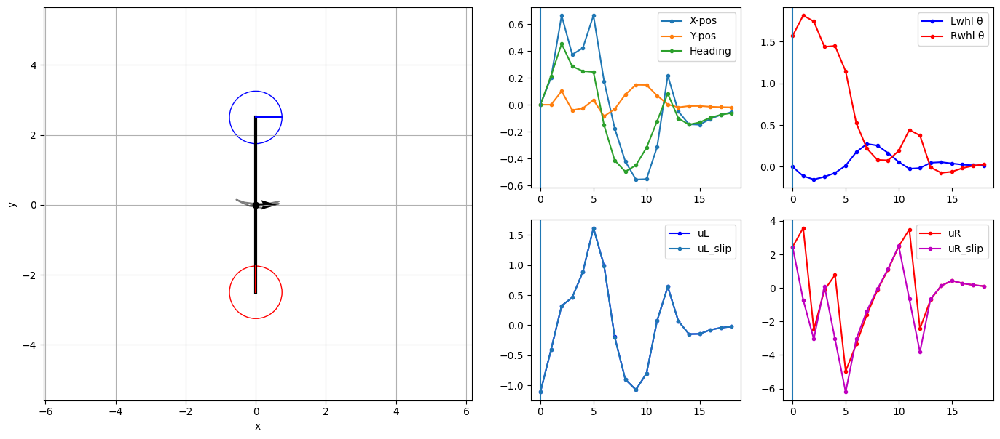

In [184]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle
import numpy as np

def plotRoverState(ax, x, y, psi, phiL, phiR, L, r_ratio):
    r = r_ratio * L / 2
    dx = (L / 2) * np.cos(psi + np.pi / 2)
    dy = (L / 2) * np.sin(psi + np.pi / 2)
    
    #Show the full trajectory
    ax.plot(q_traj_batch[0,:], q_traj_batch[1,:], 'k-', alpha=0.5)

    #Plot the rover
    ax.plot([x - dx, x + dx], [y - dy, y + dy], 'k-', linewidth=3)
    ax.plot(x, y, 'ko')
    ax.quiver(x, y, np.cos(psi), np.sin(psi), scale=20)
    
    wheelPosL = (x + dx, y + dy)
    wheelPosR = (x - dx, y - dy)

    circle1 = Circle(wheelPosL, r, edgecolor='b', facecolor='none')
    circle2 = Circle(wheelPosR, r, edgecolor='r', facecolor='none')
    ax.add_patch(circle1)
    ax.add_patch(circle2)

    ax.plot([wheelPosL[0], wheelPosL[0] + r * np.cos(phiL)], 
            [wheelPosL[1], wheelPosL[1] + r * np.sin(phiL)], 'b-')
    ax.plot([wheelPosR[0], wheelPosR[0] + r * np.cos(phiR)], 
            [wheelPosR[1], wheelPosR[1] + r * np.sin(phiR)], 'r-')

def calculate_wheel_positions(trajectory, L):
    N = len(trajectory)
    print(np.shape(trajectory))
    wheelL_pos = np.zeros((N, 2))
    wheelR_pos = np.zeros((N, 2))

    for i in range(N):
        x, y, psi, _, _ = trajectory[i]
        dx = (L / 2) * np.cos(psi + np.pi / 2)
        dy = (L / 2) * np.sin(psi + np.pi / 2)

        wheelL_pos[i] = [x + dx, y + dy]
        wheelR_pos[i] = [x - dx, y - dy]

    return wheelL_pos, wheelR_pos

def animate_trajectory(q_traj, u_traj, uslip_traj, qf, L):
    n_k = np.shape(u_traj)[0]
    print(n_k)
    eps = 0.01
    for i in range(n_k):
        if ((q_traj[i,0] - qf[0])**2<= eps) & ((q_traj[i,1]-qf[1])**2<=eps) & ((q_traj[i,2]-qf[2])**2<=eps) & ((q_traj[i,3]-qf[3])**2<=eps) & ((q_traj[i,4]-qf[4])**2<=eps) & (uslip_traj[i,0]**2 <= eps) & (uslip_traj[i,1]**2<= eps):
            n_k = i
            break
    print(n_k)        
    wheelL_pos, wheelR_pos = calculate_wheel_positions(q_traj, L)

    fig = plt.figure(figsize=(14, 6))
    ax1 = plt.subplot2grid((2, 4), (0, 0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((2, 4), (0, 2))
    ax3 = plt.subplot2grid((2, 4), (0, 3))
    ax4 = plt.subplot2grid((2, 4), (1, 2))
    ax5 = plt.subplot2grid((2, 4), (1, 3))
    plt.tight_layout()

    def update(frame):
        ax1.clear()
        ax2.clear()
        ax3.clear()
        ax4.clear()
        ax5.clear()

        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_xlim([min(q_traj[:,0])-(r_cm+L_cm/2), max(q_traj[:,0])+(r_cm+L_cm/2)])
        ax1.set_ylim([min(q_traj[:,1])-(r_cm+L_cm/2), max(q_traj[:,1])+(r_cm+L_cm/2)])
        ax1.grid(True)
        ax1.set_aspect('equal')

        # Plot rover state
        plotRoverState(ax1, *q_traj[frame], L, 0.3)

        # Plot trajectory
        x, y, psi, phiL, phiR = q_traj.T
        ax2.plot(range(n_k), x[:n_k], '.-', label='X-pos')
        ax2.plot(range(n_k), y[:n_k], '.-', label='Y-pos')
        ax2.plot(range(n_k), psi[:n_k], '.-', label='Heading')
        ax2.axvline(frame, 0, 1)
        ax2.legend()

        # Plot wheel angles
        ax3.plot(range(n_k), phiL[:n_k], '.-b', label="Lwhl θ")
        ax3.plot(range(n_k), phiR[:n_k], '.-r', label="Rwhl θ")
        ax3.axvline(frame, 0, 1)
        ax3.legend()

        # Plot input left
        ax4.plot(range(n_k), u_traj[:n_k, 0], '.-b', label="uL")
        ax4.plot(range(n_k), uslip_traj[:n_k, 0], '.-', label="uL_slip")
        ax4.axvline(frame, 0, 1)
        ax4.legend()

        # Plot input right
        ax5.plot(range(n_k), u_traj[:n_k, 1], '.-r', label="uR")
        ax5.plot(range(n_k), uslip_traj[:n_k, 1], '.-m', label="uR_slip")
        ax5.axvline(frame, 0, 1)
        ax5.legend()

        return ax1, ax2, ax3, ax4

    ani = FuncAnimation(fig, update, frames=n_k, repeat=False)
    return ani


ani = animate_trajectory(q_traj_batch.T, u_traj_batch.T, uslip_traj_batch.T, qf, L_cm)
# Display animation in Jupyter
from IPython.display import HTML
HTML(ani.to_jshtml())
 

# CFTOC(k) of MPC

In [188]:
# from pyomo.util.infeasible import log_infeasible_constraints
# # Set the logger to DEBUG level
# logging.basicConfig(level=logging.DEBUG)

def solve_cftoc_mpc(q0, q_ref, u_ref, N, Q_wheelAngle, Q_tracking, U_tracking, P, r, L, Ts):    
    model = pyo.ConcreteModel()

    #Define the variables
    nq = 5
    nu = 2
    model.N = N
    model.tidx = pyo.Set(initialize=range(N+1), ordered=True)
    model.tuidx = pyo.Set(initialize=range(N), ordered=True)
    model.qidx = pyo.Set(initialize=range(nq), ordered=True)
    model.uidx = pyo.Set(initialize=range(nu), ordered=True)

    model.q = pyo.Var(model.qidx, model.tidx)
    model.u = pyo.Var(model.uidx, model.tuidx, bounds=(-MAX_U/2, MAX_U/2))
    model.u_slip = pyo.Var(model.uidx, model.tuidx, bounds=(-MAX_U, MAX_U))
    
    def slip(model, i, t):
        return model.u_slip[i,t] - (model.u[i,t] + ((model.u[i,t+1]-model.u[i,t-1])/3)**7) == 0 if t > 0 and t<model.N-1 else pyo.Constraint.Skip

    #Define the constraints
    #initial condition - fix these at the initial state
    model.init_condition = pyo.Constraint(model.qidx, rule=lambda model, i: model.q[i,0] == q0[i])

    #System dynamics, don't include the last time step, so use tuidx
    model.sys_dyn0 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[0, t+1] == model.q[0, t] + Ts*(r/2)*pyo.cos(model.q[2,t]) * (model.u[0, t] + model.u[1, t]))
    model.sys_dyn1 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[1, t+1] == model.q[1, t] + Ts*(r/2)*pyo.sin(model.q[2,t]) * (model.u[0, t] + model.u[1, t]))
    model.sys_dyn2 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[2, t+1] == model.q[2, t] + Ts*(r/L)*(-model.u[0, t] + model.u[1, t]))
    model.sys_dyn3 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[3, t+1] == model.q[3, t] + Ts*model.u_slip[0, t])
    model.sys_dyn4 = pyo.Constraint(model.tuidx, rule=lambda model, t: model.q[4, t+1] == model.q[4, t] + Ts*model.u_slip[1, t])
    
    #Slip Dynamics
    model.sys_dyn5 = pyo.Constraint(model.uidx, model.tuidx, rule=slip)
    model.sys_dyn6 = pyo.Constraint(expr = model.u_slip[0,0] == model.u[0,0])
    model.sys_dyn7 = pyo.Constraint(expr = model.u_slip[1,0] == model.u[1,0])
    model.sys_dyn8 = pyo.Constraint(expr = model.u_slip[0,N-1] == model.u[0,N-1])
    model.sys_dyn9 = pyo.Constraint(expr = model.u_slip[1,N-1] == model.u[1,N-1])
    
    #Final Constraint, must get to the final state of the defined trajectory
    epsilon = 0.01
    qf = q_ref[:,-1]
    # model.final_constraint0 = pyo.Constraint(expr = (model.q[0,N] - qf[0])**2 <= epsilon)
    # model.final_constraint1 = pyo.Constraint(expr = (model.q[1,N] - qf[1])**2 <= epsilon)
    # model.final_constraint2a = pyo.Constraint(expr = (pyo.cos(model.q[2,N]) - pyo.cos(qf[2]))**2 <= epsilon)
    # model.final_constraint2b = pyo.Constraint(expr = (pyo.sin(model.q[2,N]) - pyo.sin(qf[2]))**2 <= epsilon)
    model.final_constraint3a = pyo.Constraint(expr = (pyo.cos(model.q[3,N]) - pyo.cos(qf[3]))**2 <= epsilon)
    model.final_constraint3b = pyo.Constraint(expr = (pyo.sin(model.q[3,N]) - pyo.sin(qf[3]))**2 <= epsilon)
    model.final_constraint4a = pyo.Constraint(expr = (pyo.cos(model.q[4,N]) - pyo.cos(qf[4]))**2 <= epsilon)
    model.final_constraint4b = pyo.Constraint(expr = (pyo.sin(model.q[4,N]) - pyo.sin(qf[4]))**2 <= epsilon)

    #Input constraint, max ΔU
    model.input_deltaConstraint0 = pyo.Constraint(model.tuidx, rule=lambda model, t: (model.u_slip[0,t+1] - model.u_slip[0,t])**2 <= MAX_deltaU if t < N-1 else pyo.Constraint.Skip)
    model.input_deltaConstraint1 = pyo.Constraint(model.tuidx, rule=lambda model, t: (model.u_slip[1,t+1] - model.u_slip[1,t])**2 <= MAX_deltaU if t < N-1 else pyo.Constraint.Skip)

    # Cost function
    def cost_rule(model):
        final_state_cost = 0
        tracking_cost = 0
        wheelAngle_cost = 0

        # Wheel angle cost
        # for t in model.tuidx:
        #     wheelAngle_cost += Q_wheelAngle * (model.q[4,t] - model.q[3,t])**2

        # Tracking cost
        for t in model.tidx:
            if t < model.N:
                for i in model.qidx:
                    tracking_cost += Q_tracking[i,i] * (model.q[i,t] - q_ref[i,t])**2
        for t in model.tuidx:
            if t < model.N-1:
                for i in model.uidx:
                    tracking_cost += U_tracking[i,i] * (model.u[i,t] - u_ref[i,t])**2

        # Soft constraints for the final state
        for i in model.qidx:
            final_state_cost += P[i,i] * (model.q[i,N] - qf[i])**2

        return tracking_cost + final_state_cost + wheelAngle_cost
    
    model.cost = pyo.Objective(rule=cost_rule, sense=pyo.minimize)

    # Solve the optimization problem
    solver = pyo.SolverFactory('ipopt')
    results = solver.solve(model)
  
    feas = str(results.solver.termination_condition) == "optimal"
    qOpt = np.asarray([model.q[:,t]() for t in model.tidx]).T
    uOpt = np.asarray([model.u[:,t]() for t in model.tuidx]).T
    uslipOpt = np.asarray([model.u_slip[:,t]() for t in model.tuidx]).T
    JOpt = model.cost()
    # log_infeasible_constraints(model)

    return feas, qOpt, uOpt, uslipOpt, JOpt, model, results


In [186]:
from scipy.integrate import solve_ivp

# Function to discretize the continuous time dynamics, using Runge-Kutta integration
def sysDyn_sim_RK_kplus1(q_k, u_k, uslip_k, r, L, Ts):
    def continuous_dynamics(t, q_k, u_k, r, L):
        dx = (r/2)*(u_k[0] + u_k[1])*np.cos(q_k[2])
        dy = (r/2)*(u_k[0] + u_k[1])*np.sin(q_k[2])
        dpsi = (r/L)*(-u_k[0] + u_k[1])
        dphiL = uslip_k[0]
        dphiR = uslip_k[1]

        dqdt = np.array([dx, dy, dpsi, dphiL, dphiR])
        return dqdt

    t_span = [0, Ts]
    
    # Using solve_ivp to integrate using 'RK45' (Runge-Kutta-Fehlberg)
    sol = solve_ivp(continuous_dynamics, t_span, q_k, args=(u_k, r, L), method='RK45')

    q_kplus1 = sol.y[:, -1]  # final state at time Ts
    return q_kplus1

# Function to discretize the continuous time dynamics, using Euler discretization
def sysDyn_sim_euler_kplus1(q_k, u_k, r, L, Ts):
    B = np.array([  [r/2*np.cos(q_k[2]), r/2*np.cos(q_k[2])], 
                    [r/2*np.sin(q_k[2]), r/2*np.sin(q_k[2])],
                    [-r/L, r/L], 
                    [1, 0], 
                    [0, 1]])
    q_kplus1 = q_k + Ts * B @ u_k

    return q_kplus1

# Simulate Entire MPC

In [189]:
N_batch = 100
N_horizon = 10
q0 = [0,0,0, np.pi/2, 0]
qf = np.array([0, 0, 0, 0, 0])
P_batch = np.diag([1, 1, 1, 1, 1])

# 1) Batch trajectory calculation
[feas, q_traj_batch, u_traj_batch, uslip_traj_batch, JOpt, model, results] = solve_cftoc_batch(q0, qf, N_batch, P_batch, r_cm, L_cm, Ts, MAX_deltaU)

# 2) Simulate the system using the optimal inputs
def simulate_system_mpc(q0, q_traj_batch, u_traj_batch, Q_wheelAngle, Q_tracking, U_tracking, P_MPC, N_horizon, r_cm, L_cm, Ts):
    nq = 5
    nu = 2

    # Get the number of time steps in the batch trajectory. This is the number of MPC iterations
    N_batch = q_traj_batch.shape[1] - 1

    # Vars to store the MPC, open loop trajectory and inputs
    q_MPC = np.zeros((nq, N_batch+1))
    q_MPC[:, 0] = q0
    u_MPC = np.zeros((nu, N_batch))
    uslip_MPC = np.zeros((nu, N_batch))

    q_MPC_openloop = np.zeros((nq, N_batch+1, N_horizon+1))
    u_MPC_openloop = np.zeros((nu, N_batch+1, N_horizon))
    uslip_MPC_openloop = np.zeros((nu, N_batch+1, N_horizon))

    # Pad the reference trajectories
    q_traj_batch = np.hstack((q_traj_batch, np.tile(q_traj_batch[:, -1], (N_horizon, 1)).T))
    u_traj_batch = np.hstack((u_traj_batch, np.zeros((nu, N_horizon))))

    for t_mpc in range(N_batch):
        # Define the reference trajectory for MPC horizon
        q_ref = q_traj_batch[:, t_mpc:t_mpc + N_horizon + 1]
        u_ref = u_traj_batch[:, t_mpc:t_mpc + N_horizon]

        # Get the MPC open loop trajectory/input
        feas, qOpt, uOpt, uslipOpt, JOpt, model, results = solve_cftoc_mpc(q_MPC[:, t_mpc], q_ref, u_ref, N_horizon, Q_wheelAngle, Q_tracking, U_tracking, P_MPC, r_cm, L_cm, Ts)
        if not feas:
            print(f"Optimization failed at time {t_mpc}")
            print(f"State: {q_MPC[:, t_mpc]}")
            print(f"Reference: {q_ref}")
            break

        q_MPC_openloop[:, t_mpc, :] = qOpt
        u_MPC_openloop[:, t_mpc, :] = uOpt
        uslip_MPC_openloop[:, t_mpc, :] = uslipOpt

        # Apply the first input to the system, simulate forward
        u_MPC[:, t_mpc] = uOpt[:, 0]
        uslip_MPC[:, t_mpc] = uslipOpt[:, 0]
        q_MPC[:, t_mpc+1] = sysDyn_sim_RK_kplus1(q_MPC[:, t_mpc], u_MPC[:, t_mpc], uslip_MPC[:,t_mpc], r_cm, L_cm, Ts)
    return q_MPC, u_MPC, q_MPC_openloop, u_MPC_openloop

Q_wheelAngle = 10                                # Penalty for wheel angle difference, combats wheel slip, but deviates from the reference trajectory
Q_tracking = np.diag([2,2,2,1,1])        #Weights for tracking the reference trajectory
U_tracking = np.diag([2, 2])                #Weights for the control input
P_MPC = np.diag([1, 1, 1, 1, 1])          #Weights for tracking the final trajectory state

q_MPC, u_MPC, q_MPC_openloop, u_MPC_openloop = simulate_system_mpc(q0, q_traj_batch, u_traj_batch, Q_wheelAngle, Q_tracking, U_tracking, P_MPC, N_horizon, r_cm, L_cm, Ts)

print(f"Initial state: {q0}")
print(f"Desired final state: {qf}")
print(f"Final state (MPC):   {q_MPC[:, -1]}")
print(f"Final state (batch): {q_traj_batch[:, -1]}")
print(f"Batch Δphi = {q_traj_batch[3,-1] - q_traj_batch[4,-1]:.4f}")
print(f"MPC Δphi = {q_MPC[3,-1] - q_MPC[4,-1]:.4f}")


Initial state: [0, 0, 0, 1.5707963267948966, 0]
Desired final state: [0 0 0 0 0]
Final state (MPC):   [-0.19135333 -0.18810415  0.49085777  1.07843587  0.32573583]
Final state (batch): [-0.02246027  0.02096993  0.0412601   0.05712032  0.00760821]
Batch Δphi = 0.0495
MPC Δphi = 0.7527


100
100


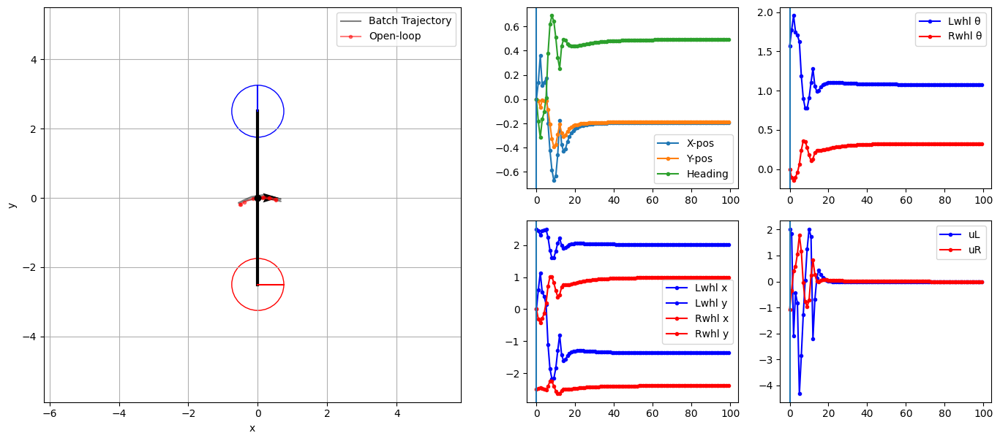

In [190]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle
import numpy as np

def plotRoverState(ax, x, y, psi, phiL, phiR, L, r_ratio):
    r = r_ratio * L / 2
    dx = (L / 2) * np.cos(psi + np.pi / 2)
    dy = (L / 2) * np.sin(psi + np.pi / 2)

    #Plot the rover
    ax.plot([x - dx, x + dx], [y - dy, y + dy], 'k-', linewidth=3)
    ax.plot(x, y, 'ko')
    ax.quiver(x, y, np.cos(psi), np.sin(psi), scale=20)
    
    wheelPosL = (x + dx, y + dy)
    wheelPosR = (x - dx, y - dy)

    circle1 = Circle(wheelPosL, r, edgecolor='b', facecolor='none')
    circle2 = Circle(wheelPosR, r, edgecolor='r', facecolor='none')
    ax.add_patch(circle1)
    ax.add_patch(circle2)

    ax.plot([wheelPosL[0], wheelPosL[0] + r * np.cos(phiL)], 
            [wheelPosL[1], wheelPosL[1] + r * np.sin(phiL)], 'b-')
    ax.plot([wheelPosR[0], wheelPosR[0] + r * np.cos(phiR)], 
            [wheelPosR[1], wheelPosR[1] + r * np.sin(phiR)], 'r-')

def calculate_wheel_positions(trajectory, L):
    N = len(trajectory)
    wheelL_pos = np.zeros((N, 2))
    wheelR_pos = np.zeros((N, 2))

    for i in range(N):
        x, y, psi, _, _ = trajectory[i]
        dx = (L / 2) * np.cos(psi + np.pi / 2)
        dy = (L / 2) * np.sin(psi + np.pi / 2)

        wheelL_pos[i] = [x + dx, y + dy]
        wheelR_pos[i] = [x - dx, y - dy]

    return wheelL_pos, wheelR_pos

def animate_trajectory_mpc(q_traj, u_traj, q_traj_OL, qf, L):
    # N = len(u_traj)
    n_k = np.shape(u_traj)[0]
    print(n_k)
    eps = 0.001
    for i in range(n_k):
        if ((q_traj[i,0] - qf[0])**2<= eps) & ((q_traj[i,1]-qf[1])**2<=eps) & ((q_traj[i,2]-qf[2])**2<=eps) & ((q_traj[i,3]-qf[3])**2<=eps) & ((q_traj[i,4]-qf[4])**2<=eps) & (u_traj[i,0]**2 <= eps) & (u_traj[i,1]**2<= eps):
            n_k = i
            break
    print(n_k)
    
    
    wheelL_pos, wheelR_pos = calculate_wheel_positions(q_traj, L)

    fig = plt.figure(figsize=(14, 6))
    ax1 = plt.subplot2grid((2, 4), (0, 0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((2, 4), (0, 2))
    ax3 = plt.subplot2grid((2, 4), (0, 3))
    ax4 = plt.subplot2grid((2, 4), (1, 2))
    ax5 = plt.subplot2grid((2, 4), (1, 3))
    plt.tight_layout()

    def update(frame):
        ax1.clear()
        ax2.clear()
        ax3.clear()
        ax4.clear()
        ax5.clear()

        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_xlim([min(q_traj[:,0])-(r_cm+L_cm/2), max(q_traj[:,0])+(r_cm+L_cm/2)])
        ax1.set_ylim([min(q_traj[:,1])-(r_cm+L_cm/2), max(q_traj[:,1])+(r_cm+L_cm/2)])
        ax1.grid(True)
        ax1.set_aspect('equal')

        # Plot rover state
        #Show the full trajectory
        line_batch = ax1.plot(q_traj_batch[0,:], q_traj_batch[1,:], 'k-', alpha=0.5, label='Batch Trajectory')
        line_OL = ax1.plot(q_traj_OL[0, frame, :], q_traj_OL[1, frame, :], 'r.-', alpha=0.5, label='Open-loop')
        plotRoverState(ax1, *q_traj[frame], L, 0.3)
        ax1.legend([line_batch[0], line_OL[0]], ['Batch Trajectory', 'Open-loop'])

        # Plot trajectory
        x, y, psi, phiL, phiR = q_traj.T
        ax2.plot(range(n_k), x[:n_k], '.-', label='X-pos')
        ax2.plot(range(n_k), y[:n_k], '.-', label='Y-pos')
        ax2.plot(range(n_k), psi[:n_k], '.-', label='Heading')
        ax2.axvline(frame, 0, 1)
        ax2.legend()

        # Plot wheel angles
        ax3.plot(range(n_k), phiL[:n_k], '.-b', label="Lwhl θ")
        ax3.plot(range(n_k), phiR[:n_k], '.-r', label="Rwhl θ")
        ax3.axvline(frame, 0, 1)
        ax3.legend()

        # Plot wheel positions
        ax4.plot(range(n_k), wheelL_pos[:n_k, 0], '.-b', label="Lwhl x")
        ax4.plot(range(n_k), wheelL_pos[:n_k, 1], '.-b', label="Lwhl y")
        ax4.plot(range(n_k), wheelR_pos[:n_k, 0], '.-r', label="Rwhl x")
        ax4.plot(range(n_k), wheelR_pos[:n_k, 1], '.-r', label="Rwhl y")
        ax4.axvline(frame, 0, 1)
        ax4.legend()

        # Plot inputs
        ax5.plot(range(n_k), u_traj[:n_k, 0], '.-b', label="uL")
        ax5.plot(range(n_k), u_traj[:n_k, 1], '.-r', label="uR")
        ax5.axvline(frame, 0, 1)
        ax5.legend()

        return ax1, ax2, ax3, ax4

    ani = FuncAnimation(fig, update, frames=n_k, repeat=False)
    return ani


ani = animate_trajectory_mpc(q_MPC.T, u_MPC.T, q_MPC_openloop, qf, L_cm)
# Display animation in Jupyter
from IPython.display import HTML
HTML(ani.to_jshtml())
 